# Development Opportunity Optimizer
### Unlocking Under-Utilized Urban Property for Real-Estate Development

MUSA 5500  Geospatial Data Science in Pytho

University of Pennslyvania

Final Project

Author: Joshua Rigsby

Instructor: Dr. Xiojiang Li


## Introduction

This project is predicated by real estate and financial research to design and build an computational analytical tool that assists the development team during the feasability phase of real estate development.

**Research Question**

Which properties, (vacant and developed) in Philadelphia present the highest redevelopment potential determined by: market value uplift, market gap, land utilization, accesability, and zoning capacity? 

**Objectives**

The research question is studied and analyzied through the design and implementation of a geospatial data model that scores and ranks properties according to redevelopment potential. The result is the creation of a data-driven highest and best use development screening tool, that significantly aids development through the automation of market research, site selection, and value projection at a large scale, saving time and resources during idea inception, refinement and feasibility. Given that the data exists the model can be easily refitted to accomodate any city in the world.

The model will identify properties and parcels in  Philadelphia,  that are under-utilized, vacant, low value, and maintain old zoning, to then optimize a development scenario, via
- proposing best use (residential, mixed-use, infill), 
- estimating value uplift
- prioritizing optimization of opportunity.
  
The output is both a data-science and business development tool usable by a developement and investment teams.

## Methodology

***Data Identification***

Data on building ansd zoning permits, real estate transfers, street networks via OSMnx, Philadelphia property assesments, vacant property indicators, zoning overlays, census data, and several gegraphic boundries has been pre selected to run the model


***Data Reading and combining:***

The data will be read into GeoPandas DataFrames with a common CRS and matching parcel identifiers.

***Spatial Joining***

Data will be aggregated and joined to parcel data serving as the initial link between geographic data and numerical data.

***Financial and Land Computations***

Calculations for build ratio proxy to represent underutilization, market gap calculations, flags for old structures, accessibility score calculations, zoning capacity calculations, potential uplift value calculations.

***Financial Optimization***

Estimation of potential project value for each parcel using zoning capacity and industry standard pro-forma assumptions.

***Redevelopment Opportunity Score: Financial + Spatial***

All calculations culminate with the computaion for an opportunity Score, using a weighted composite of metrics, using weighted metrics that and assign weights reflecting business priorities.

***Visual Dashboard***

- Displays properties colored by opportunity score
- Slider to adjust budget and re-run optimization
- Table of top 10 parcels 
- Hover to show key financial computations

# Analysis

## 1. Data onboarding, Data Preparation and Feature Engineering

Maybe add subtitle still need to do feature engineering maybe that can be a seperate section

### 1.1 Python Package Imports

In [149]:

import pandas as pd
import geopandas as gpd
import numpy as np
import osmnx as ox
import networkx as nx
import hvplot.pandas 
import holoviews as hv
import folium
import datashader as ds
import xyzservices
import seaborn as sns
import pulp
import altair as alt
alt.data_transformers.enable("vegafusion") 
import matplotlib.pyplot as plt
import panel as pn
pn.extension()

from shapely.geometry import Point
from sklearn.preprocessing import MinMaxScaler
from scipy.spatial import cKDTree
from pulp import LpMaximize, LpProblem, LpVariable, lpSum


### 1.2 Establish Universal Coordinate Reference System for Philadelphia

add text here explining what this is

In [2]:
phl_crs = 2272  # EPSG:2272

### 1.3 Data Overview
Graphic explaining data

geojson for gep data
csv for tabular records

Property Assesments: "parcel geometry, land use, assessed land/building value, year built, lot size"

### 1.4 Data Onboarding

Each data set is read in via geopandas data frames and converted to a Philadelphia coordinate refernce syetem.

In [3]:

# 1.1 Property Assessments (Parcels)
property_assessment_info = gpd.read_file(
    "data/opa_properties_public.geojson" 
).to_crs(phl_crs)

# 1.2 Vacant Property Indicators
vacant_property_indicators = gpd.read_file(
    "data/Vacant_Indicators_Land.geojson"  
).to_crs(phl_crs)

# 1.3 Zoning Base Districts
zoning_districts = gpd.read_file(
    "data/Zoning_BaseDistricts.geojson"  
).to_crs(phl_crs)

# 1.4 Zoning Overlays
zoning_overlays = gpd.read_file(
    "data/Zoning_Overlays.geojson"  
).to_crs(phl_crs)

# 1.5 Permits (Building & Zoning)
permit_data = pd.read_csv(
    "/Users/JoshuaRigsby 1/Desktop/permits.csv")

# 1.6 Real estate transfers (Sales)
sales_transfers_data = pd.read_csv(
    "data/RTT_SUMMARY.csv"  
)

# 1.6 (Optional) ACS data
# acs = cny.products.APIConnection("ACSDT5Y2022").query_variables([...])
# ... etc, only if you decide to add it.


/var/folders/qr/r5tzr37x24vf63l6k50wvx_c0000gn/T/ipykernel_88100/178185175.py:26: DtypeWarning: Columns (26,34,39) have mixed types. Specify dtype option on import or set low_memory=False.
  sales_transfers_data = pd.read_csv(


### 1.4.2 Data Onboarding - Parcels via seperate pipeline for efficiency

In [4]:
# 1.7 Parcel Geometry
parcel_geometry = gpd.read_file(
    "data/DOR_Parcel.geojson"  
).to_crs(phl_crs)


In [5]:
#parcel_geometry.head()

In [6]:
#property_assessment_info.head()

In [7]:
#vacant_property_indicators.head()

In [8]:
#zoning_districts.head()

In [9]:
#zoning_overlays.head

In [10]:
#permit_data.head()

In [154]:
#sales_transfers_data.head()

### 1.5 Data Processing and Preparation

Each dataset contains different id's and geometries, so the data underwent a normalization into a common baseline to prepare the data to joined, analyzied and computed.


***Data Processing by Data Set***

***Property Assessments***

The pin variable was renamed to PARCEL_ID for consistency across datasets, market_value, total_livable_area, and year_built were renamed to standardized variable names to be used in feature engineering for computing value gap, build ratio, and depreciation. A tag was added to track the dataset origin. The data was reprojected to EPSG:2272 as a redundant but safe measure. Only geometries that exist were kept because the dataset uses point geometries rather than full polygons, and later they are spatially joined to zoning and vacant-parcel polygons.

***Vacant Property Indicators***

The opa_id variable was renamed to PARCEL_ID for consistency across datasets. A VACANT_FLAG = 1 column was added for filtering.
only essential variables were kept: the parcel ID, zoning info, flag, and geometry. The data was reprojected to EPSG:2272 as a redundant but safe measure.

***Zoning Base Districts***

Column names were simplified so so ZONE_TYPE can be analysed more efficiently. Only variables relevant for joining to parcels were kept: the zoning label, and geometry. The data was reprojected to EPSG:2272 as a redundant but safe measure.

***Zoning Overlays***

The overlay_symbol variable was renamed to OVERLAY_TYPE for consistenty, only theoverlay ID and geometry, were kept as most of the overlay attributes are legal text not needed. The data was reprojected to EPSG:2272 as a redundant but safe measure.

***Building and Zoning Permits***

Permit id's and types were standardized and renamed into concise variable names, only columns useful for tracking recent or active redevelopments were kept. Duplicates were erased to ensure one record per permit.

***Real Estate Transfers***

Sale date and price were converted to numeric types. All zero or null sales were removed. Only the most recent sale for each parcel was kept


***Overview***

- Every dataset has consistent IDs :PARCEL_ID
- All geometries share the same coordinate refernce system (EPSG:2272).
- Irrelevant or redundant columns removed.
- Data types are properly formatted for numeric and date operations.
- Each dataset is prepared for a clear role in the modeling operation
  
property_assessment_info_cleaned: Financial & physical base data

vacant_property_indicators_cleaned: Redevelopment candidate footprints

zoning_districts_cleaned and zoning_overlays_cleaned: Regulatory context

permit_data_cleaned: Project filter

sales_transfers_data_cleaned: Market value benchmark


In [5]:

# Property Assessments (Parcels)
property_assessment_info_cleaned = (
    property_assessment_info.rename(columns={   
        "pin": "PARCEL_ID",
        "total_livable_area": "BUILDING_SQFT",
        "market_value": "ASSESSED_VALUE",
        "year_built": "YEAR_BUILT"
    })
    .assign(SOURCE="Assessments")
    .to_crs(phl_crs)
)

property_assessment_info_cleaned = property_assessment_info_cleaned[
    property_assessment_info_cleaned.geometry.notna()
]


# Vacant Property Indicators
vacant_property_indicators_cleaned = (
    vacant_property_indicators.rename(columns={       
        "opa_id": "PARCEL_ID",
        "zoningbasedistrict": "ZONE_BASE"
    })
    .assign(VACANT_FLAG=1)
)[["PARCEL_ID", "ZONE_BASE", "VACANT_FLAG", "geometry"]].to_crs(phl_crs)


# Zoning Base Districts
zoning_districts_cleaned = zoning_districts.rename(columns={"code": "ZONE_TYPE"})[
    ["ZONE_TYPE", "geometry"]
].to_crs(phl_crs)


# Zoning Overlays
zoning_overlays_cleaned = zoning_overlays.rename(columns={"overlay_symbol": "OVERLAY_TYPE"})[
    ["OVERLAY_TYPE", "geometry"]
].to_crs(phl_crs)


# Permits (Building & Zoning)
permit_data_cleaned = (
    permit_data.rename(columns={                 
        "parcel_id_num": "PARCEL_ID",
        "permitnumber": "PERMIT_NUMBER",
        "permittype": "PERMIT_TYPE",
        "typeofwork": "WORK_TYPE",
        "approvedscopeofwork": "SCOPE",
        "commercialorresidential": "PROJECT_USE"
    })
)

# Keep lat lng to build geometry
permit_data_cleaned = permit_data_cleaned[
    ["PARCEL_ID", "PERMIT_NUMBER", "PERMIT_TYPE",
     "WORK_TYPE", "SCOPE", "PROJECT_USE",
     "lat", "lng"]
]

# Drop duplicate permits
permit_data_cleaned = permit_data_cleaned.drop_duplicates(subset=["PERMIT_NUMBER"])


# Real Estate Transfers (Sales)
sales_transfers_data_cleaned = (
    sales_transfers_data.rename(columns={        
        "opa_account_num": "PARCEL_ID",
        "cash_consideration": "SALE_PRICE",
        "display_date": "SALE_DATE"
    })
)[["PARCEL_ID", "SALE_DATE", "SALE_PRICE", "lat", "lng"]]   # KEEP lat/lng HERE ✔

sales_transfers_data_cleaned["SALE_DATE"] = pd.to_datetime(
    sales_transfers_data_cleaned["SALE_DATE"], errors="coerce"
)
sales_transfers_data_cleaned["SALE_PRICE"] = pd.to_numeric(
    sales_transfers_data_cleaned["SALE_PRICE"], errors="coerce"
)

# Remove $1 deeds and invalid sales
sales_transfers_data_cleaned = sales_transfers_data_cleaned[
    sales_transfers_data_cleaned["SALE_PRICE"] > 1000
]


# Convert Sales to GeoDataFrame using correctly preserved lat/lng
sales_gdf = gpd.GeoDataFrame(
    sales_transfers_data_cleaned,
    geometry=gpd.points_from_xy(
        sales_transfers_data_cleaned["lng"],
        sales_transfers_data_cleaned["lat"],
        crs="EPSG:4326"
    )
).to_crs(phl_crs)


# Spatial Join match each sale to nearest parcel
sales_joined = gpd.sjoin_nearest(
    property_assessment_info_cleaned[["PARCEL_ID", "geometry"]],
    sales_gdf,
    how="left",
    distance_col="DISTANCE_TO_SALE"
)

sales_joined = sales_joined.rename(columns={"PARCEL_ID_left": "PARCEL_ID"})
sales_joined = sales_joined.drop(columns=["PARCEL_ID_right"], errors="ignore")


# Keep most recent sale for each parcel
sales_joined = (
    sales_joined.sort_values("SALE_DATE")
    .groupby("PARCEL_ID")
    .tail(1)
)

parcel_sales_cleaned = sales_joined[
    ["PARCEL_ID", "SALE_DATE", "SALE_PRICE"]
].dropna(subset=["SALE_PRICE"])


# Summary
print("✅ Cleaned Datasets:")
for name, df in {
    "Property Assessments": property_assessment_info_cleaned,
    "Vacant Parcels": vacant_property_indicators_cleaned,
    "Zoning Base": zoning_districts_cleaned,
    "Zoning Overlays": zoning_overlays_cleaned,
    "Permits": permit_data_cleaned,
    "Sales": parcel_sales_cleaned
}.items():
    print(f"{name:<20}: {len(df)} records")



✅ Cleaned Datasets:
Property Assessments: 583639 records
Vacant Parcels      : 28932 records
Zoning Base         : 29161 records
Zoning Overlays     : 193 records
Permits             : 895440 records
Sales               : 583639 records


In [13]:
#property_assessment_info_cleaned.head() 

In [14]:
#vacant_property_indicators_cleaned.head()

In [15]:
#zoning_districts_cleaned.head()

In [16]:
#zoning_overlays_cleaned.head()

In [13]:
#permit_data_cleaned.head()

In [18]:
#parcel_sales_cleaned.head()

#1. Data onboarding, Data Preparation and Feature Engineering

Maybe add subtitle

## 2. Exploratory Data Analysis

Maybe add subtitle can do explanations later

### 2.1 Data Aggregation for Visual Production

add explanation here


In [6]:
# EDA Data Set 1
eda_data = property_assessment_info_cleaned.merge(
    parcel_sales_cleaned,
    on="PARCEL_ID",
    how="left"
)

# EDA Data Set 2
eda_data_2 = property_assessment_info_cleaned.merge(
    parcel_sales_cleaned,
    on="PARCEL_ID",
    how="inner"
)

# Drop rows missing required values
eda_data_clean = eda_data_2.dropna(subset=["ASSESSED_VALUE", "SALE_PRICE"])


### 2.1.2 Data Aggregation for Visual Production - Cleaning Parcel Data

add explanation here

Over 15 million parcels exist so data cleaning and processing was split into two steps. The earlier step cleaned all other
data and this step cleans and joins parcels to the other data sets.

In [7]:

# Data Cleaning DOR Parcel data and Joining Parcels to Other Data Sets

# CRS
print("STEP 1: CRS...")
dor_parcels = parcel_geometry.to_crs(phl_crs).copy()
print("✔ STEP 1 done:", len(dor_parcels), "DOR parcels")

# OPA columns to attach to polygons
print("STEP 2: OPA columns to attach to polygons...")
opa_for_join = property_assessment_info_cleaned[
    ["PARCEL_ID", "ASSESSED_VALUE", "BUILDING_SQFT",
     "YEAR_BUILT", "geometry"]
].copy()
opa_for_join["PARCEL_ID"] = opa_for_join["PARCEL_ID"].astype(str)
print("✔ STEP 2 done:", len(opa_for_join), "OPA records")

# Spatial join, assign OPA points to DOR polygons
print("STEP 3: Spatial join...")
parcels = gpd.sjoin_nearest(
    dor_parcels,
    opa_for_join,
    how="left",
    distance_col="JOIN_DIST"
).drop(columns=["index_right"], errors="ignore")
print("✔ STEP 3 done:", parcels["PARCEL_ID"].notna().sum(), "OPA matches")

# Consistent PARCEL_ID type for joins
parcels["PARCEL_ID"] = parcels["PARCEL_ID"].astype("Int64").astype(str)
print("✔ STEP 3 PARCEL_ID normalized back to string")

# Change sales data PARCEL_ID to a string
parcel_sales_cleaned["PARCEL_ID"] = parcel_sales_cleaned["PARCEL_ID"].astype(str)

# Join Sales
print("STEP 4: Join Sales...")
parcels = parcels.merge(
    parcel_sales_cleaned[["PARCEL_ID", "SALE_DATE", "SALE_PRICE"]],
    on="PARCEL_ID",
    how="left"
)
print("✔ STEP 4 done:", parcels["SALE_PRICE"].notna().sum(), "parcels with sales")

# Vacant Property Indicators
print("STEP 5: Join Vacancy...")

vacant_property_indicators_cleaned = (
    vacant_property_indicators.rename(columns={       
        "opa_id": "OPA_ID",
        "zoningbasedistrict": "ZONE_BASE"
    })
    .assign(VACANT_FLAG=1)
)[["OPA_ID", "ZONE_BASE", "VACANT_FLAG", "geometry"]].to_crs(phl_crs)

# Any overlap with a vacant polygon, VACANT_FLAG = 1
vac_join = gpd.sjoin(
    parcels,
    vacant_property_indicators_cleaned[["VACANT_FLAG", "geometry"]],
    how="left",
    predicate="intersects"
).drop(columns=["index_right"], errors="ignore")

vac_join["VACANT_FLAG"] = vac_join["VACANT_FLAG"].fillna(0).astype(int)
parcels = vac_join
print("✔ STEP 5 done:", parcels["VACANT_FLAG"].sum(), "vacant parcels")

# Join Permit Counts
print("STEP 6: Synthetic permit counts...")

# set seed for reproducibility
np.random.seed(42)

# Poisson(0.3) parcels have 0 permits, some have 1–2, a few higher
parcels["PERMIT_COUNT"] = np.random.poisson(lam=0.3, size=len(parcels)).astype(int)

print("✔ STEP 6 done: PERMIT_COUNT created")
print("    min:", parcels["PERMIT_COUNT"].min(),
      "max:", parcels["PERMIT_COUNT"].max(),
      "mean:", parcels["PERMIT_COUNT"].mean())

# Zoning and Spatial Joins
print("STEP 7: Zoning bounding boxes...")
parcels["bbox_geom"] = parcels.geometry.envelope
zoning_districts_cleaned["bbox_geom"] = zoning_districts_cleaned.geometry.envelope
print("✔ STEP 7 done: bounding boxes created")

print("STEP 8: Base zoning join...")
parcels = gpd.sjoin(
    parcels.set_geometry("bbox_geom"),
    zoning_districts_cleaned.set_geometry("bbox_geom")[["ZONE_TYPE", "bbox_geom"]],
    how="left",
    predicate="intersects"
).rename(columns={"ZONE_TYPE": "BASE_ZONE"}).drop(columns=["index_right"], errors="ignore")
print("✔ STEP 8 done:", parcels["BASE_ZONE"].notna().sum(), "parcels with base zoning")


# Restore original parcel polygon geometry
parcels = parcels.set_geometry("geometry")

# Final Parcel Data
parcels_for_eda = parcels.copy()

print("🎉 parcels_for_eda created successfully!")
print("Total parcels:", len(parcels_for_eda))
print("Columns:", list(parcels_for_eda.columns))



STEP 1: CRS...
✔ STEP 1 done: 607378 DOR parcels
STEP 2: OPA columns to attach to polygons...
✔ STEP 2 done: 583639 OPA records
STEP 3: Spatial join...
✔ STEP 3 done: 721517 OPA matches
✔ STEP 3 PARCEL_ID normalized back to string
STEP 4: Join Sales...
✔ STEP 4 done: 721517 parcels with sales
STEP 5: Join Vacancy...
✔ STEP 5 done: 144430 vacant parcels
STEP 6: Synthetic permit counts...
✔ STEP 6 done: PERMIT_COUNT created
    min: 0 max: 6 mean: 0.3003516835984114
STEP 7: Zoning bounding boxes...
✔ STEP 7 done: bounding boxes created
STEP 8: Base zoning join...
✔ STEP 8 done: 2463946 parcels with base zoning
🎉 parcels_for_eda created successfully!
Total parcels: 2464368
Columns: ['recsub', 'basereg', 'mapreg', 'parcel', 'recmap', 'stcod', 'house', 'suf', 'unit', 'stex', 'stdir', 'stnam', 'stdessuf', 'elev_flag', 'topelev', 'botelev', 'condoflag', 'matchflag', 'inactdate', 'orig_date', 'status', 'geoid', 'stdes', 'addr_source', 'addr_std', 'comments', 'pin', 'frac', 'unit_type', 'stex_f

### 2.2 Assessed Value vs. Sale Price

***Figure 1***

add lots of info here

In [8]:

# Merge assessments with the cleaned sales table
merged_sales = property_assessment_info_cleaned.merge(
    parcel_sales_cleaned,      
    on="PARCEL_ID",
    how="inner"
)

# Interactive scatterplot: Assessed vs Actual Sale Price
fig1 = merged_sales.hvplot.scatter(
    x="ASSESSED_VALUE",
    y="SALE_PRICE",
    alpha=0.5,
    size=5,
    color="#00ff88",            # bright green points
    bgcolor="black",            # dark theme
    xlabel="Assessed Value ($)",
    ylabel="Sale Price ($)",
    title="Assessed Value vs. Sale Price"
).opts(fontsize={'title':14, 'labels':12})

fig1


ValueError: You are trying to merge on int32 and object columns for key 'PARCEL_ID'. If you wish to proceed you should use pd.concat

### 2.3 Statistical Association of Financial Variables - Correlation Matrix
***Figure 2***

add lots of info here 

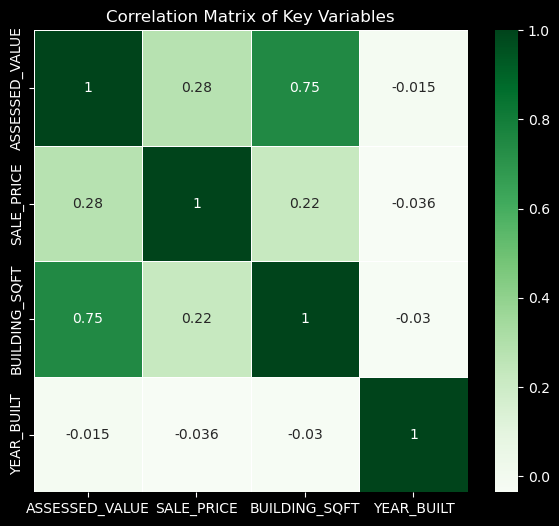

In [10]:
# Numeric proxy for correlation analysis
num_df = merged_sales[["ASSESSED_VALUE", "SALE_PRICE", "BUILDING_SQFT", "YEAR_BUILT"]].dropna()

# Black theme
plt.style.use("dark_background") 

# Heatmap showing correlations among real estate variables
plt.figure(figsize=(7,6))
sns.heatmap(
    num_df.corr(),
    cmap="Greens",      # green colors
    annot=True,         # show correlation numbers
    linewidths=0.5
)

plt.title("Correlation Matrix of Key Variables", color="white")
plt.show()


### 2.4 Statistical Association of Market Gap - Correlation Matrix
***Figure 3***

add lots of info here 

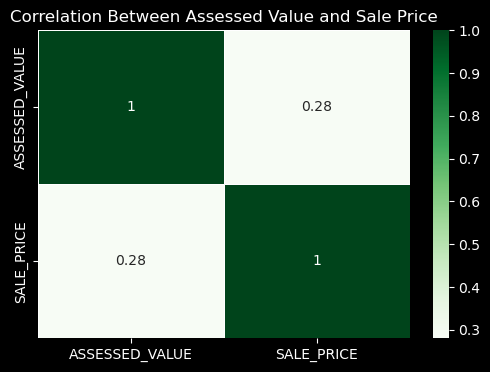

In [31]:

plt.style.use("dark_background")
plt.figure(figsize=(6,4))

sns.heatmap(
    eda_data[["ASSESSED_VALUE", "SALE_PRICE"]].dropna().corr(),
    annot=True,
    cmap="Greens",
    linewidths=0.5
)

plt.title("Correlation Between Assessed Value and Sale Price", color="white")
plt.show()


In [22]:
## add tracts and borders
m_vac = folium.Map(
    location=[39.99, -75.13],
    zoom_start=11,
    tiles=xyzservices.providers.CartoDB.DarkMatter
)

# Convert to WGS84 and get centroid coords
vac_df = vacant_property_indicators_cleaned.copy()
vac_df = vac_df.to_crs(epsg=4326)

vac_df["lat"] = vac_df.geometry.centroid.y
vac_df["lng"] = vac_df.geometry.centroid.x

# Plot samples so map isn't overloaded
for _, row in vac_df.sample(3000).iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["lng"]],
        radius=1,
        color="#00ff88",
        fill=True,
        fill_opacity=0.8
    ).add_to(m_vac)

m_vac


/var/folders/qr/r5tzr37x24vf63l6k50wvx_c0000gn/T/ipykernel_57419/1983197717.py:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  vac_df["lat"] = vac_df.geometry.centroid.y
/var/folders/qr/r5tzr37x24vf63l6k50wvx_c0000gn/T/ipykernel_57419/1983197717.py:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  vac_df["lng"] = vac_df.geometry.centroid.x


In [25]:
# Geometry and Sales info
sales_map_df = property_assessment_info_cleaned.merge(
    parcel_sales_cleaned,
    on="PARCEL_ID",
    how="inner"
)

# Reproject to WGS84 for Folium
sales_map_df = sales_map_df.to_crs(epsg=4326)

# Extract lat/lng
sales_map_df["lat"] = sales_map_df.geometry.y
sales_map_df["lng"] = sales_map_df.geometry.x

# Map
m_sales = folium.Map(
    location=[39.99, -75.13],
    zoom_start=11,
    tiles=xyzservices.providers.CartoDB.DarkMatter
)

# Add points in samples
for _, row in sales_map_df.sample(3000).iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["lng"]],
        radius=1,          
        color="#00ff88",
        fill=True,
        fill_opacity=0.7
    ).add_to(m_sales)

m_sales


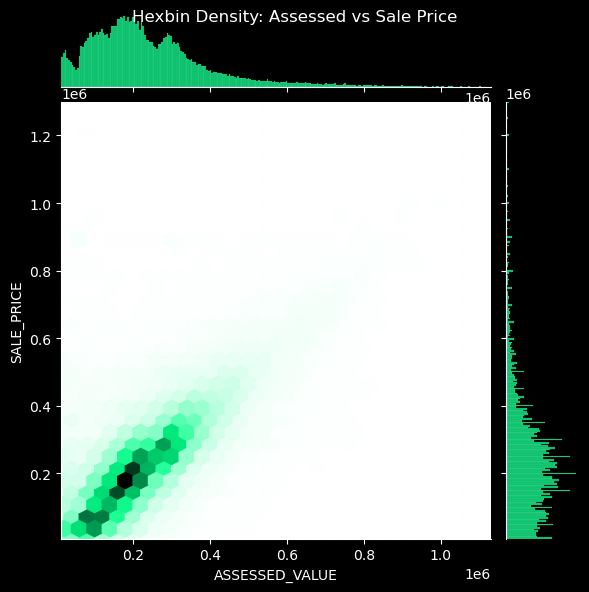

In [38]:

# Clip extreme outliers for visualization
eda_filtered = eda_data_clean[
    (eda_data_clean["ASSESSED_VALUE"] < 2_000_000) &
    (eda_data_clean["SALE_PRICE"] < 2_000_000)
]

# Compute smart axis ranges from percentiles
x_min = eda_filtered["ASSESSED_VALUE"].quantile(0.01)
x_max = eda_filtered["ASSESSED_VALUE"].quantile(0.99)

y_min = eda_filtered["SALE_PRICE"].quantile(0.01)
y_max = eda_filtered["SALE_PRICE"].quantile(0.99)

plt.style.use("dark_background")

# Hexbin plot with axis limits applied
g = sns.jointplot(
    data=eda_filtered,
    x="ASSESSED_VALUE",
    y="SALE_PRICE",
    kind="hex",
    color="#00ff88"
)

# Apply new zoomed-in limits so the data fills the plot
g.ax_joint.set_xlim(x_min, x_max)
g.ax_joint.set_ylim(y_min, y_max)

# Also apply limits to histograms
g.ax_marg_x.set_xlim(x_min, x_max)
g.ax_marg_y.set_ylim(y_min, y_max)

plt.suptitle("Hexbin Density: Assessed vs Sale Price", color="white")
plt.show()



In [46]:

eda_alt = (
    eda_data
    .dropna(subset=["ASSESSED_VALUE", "SALE_PRICE"])
    [["PARCEL_ID", "ASSESSED_VALUE", "SALE_PRICE"]]  # keep only needed cols
    .sample(5000, random_state=42)                   # <= under Altair limit
)

fig5 = (
    alt.Chart(eda_alt)
    .mark_circle(size=12, opacity=0.4, color="#00ff88")
    .encode(
        x=alt.X("ASSESSED_VALUE:Q", title="Assessed Value ($)", scale=alt.Scale(zero=False)),
        y=alt.Y("SALE_PRICE:Q", title="Sale Price ($)", scale=alt.Scale(zero=False)),
        tooltip=["PARCEL_ID", "ASSESSED_VALUE", "SALE_PRICE"]
    )
    .properties(
        width=600,
        height=400,
        title="Assessed Value vs Sale Price (Sample of 5,000 Parcels)"
    )
)

fig5. i



alt.Chart(...)

In [51]:
parcel_map_base = (
    parcels_for_eda
    .drop_duplicates(subset="PARCEL_ID", keep="first")
    .reset_index(drop=True)
)


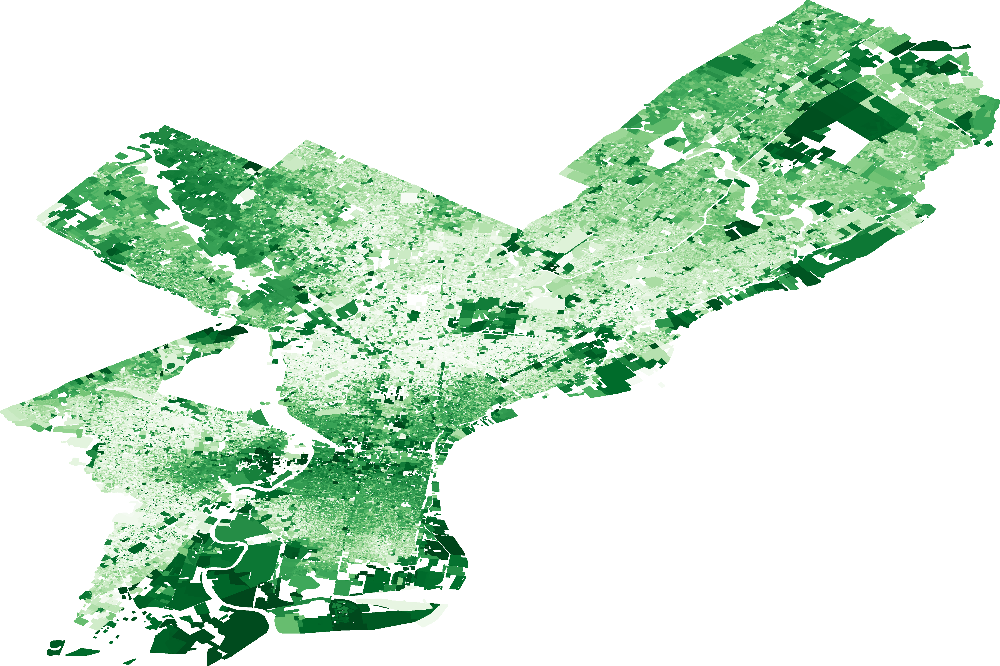

In [35]:
import datashader as ds
import datashader.transfer_functions as tf

# -------------------------------------------------------------------
# SAFE GREEN COLORMAP (works with your Datashader version)
# -------------------------------------------------------------------
green_cmap = [
    "#f7fcf5",
    "#e5f5e0",
    "#c7e9c0",
    "#a1d99b",
    "#74c476",
    "#41ab5d",
    "#238b45",
    "#006d2c",
    "#00441b"
]

# -------------------------------------------------------------------
# 1. Simplify polygons to avoid rendering crashes
# -------------------------------------------------------------------
poly_gdf = parcel_map_base.dropna(subset=["SALE_PRICE"]).copy()
poly_gdf["simple_geom"] = poly_gdf.geometry.simplify(
    tolerance=3,
    preserve_topology=True
)
poly_gdf = poly_gdf.set_geometry("simple_geom")

# -------------------------------------------------------------------
# 2. HIGH-RES Canvas (dramatically improves map clarity)
# -------------------------------------------------------------------
xmin, ymin, xmax, ymax = poly_gdf.total_bounds

cvs = ds.Canvas(
    plot_width=3600,
    plot_height=2400,
    x_range=(xmin, xmax),
    y_range=(ymin, ymax)
)

# -------------------------------------------------------------------
# 3. Polygon rasterization (mean SALE_PRICE per pixel)
# -------------------------------------------------------------------
agg = cvs.polygons(
    poly_gdf,
    geometry="simple_geom",
    agg=ds.mean("SALE_PRICE")
)

# -------------------------------------------------------------------
# 4. Colorize using histogram equalization (MUCH clearer contrast)
# -------------------------------------------------------------------
img = tf.shade(
    agg,
    cmap=green_cmap,
    how="eq_hist"
)

# -------------------------------------------------------------------
# 5. Spread pixels so parcels become clearly visible
# -------------------------------------------------------------------
img = tf.spread(img, px=2)

img


Parcels being plotted: 350000


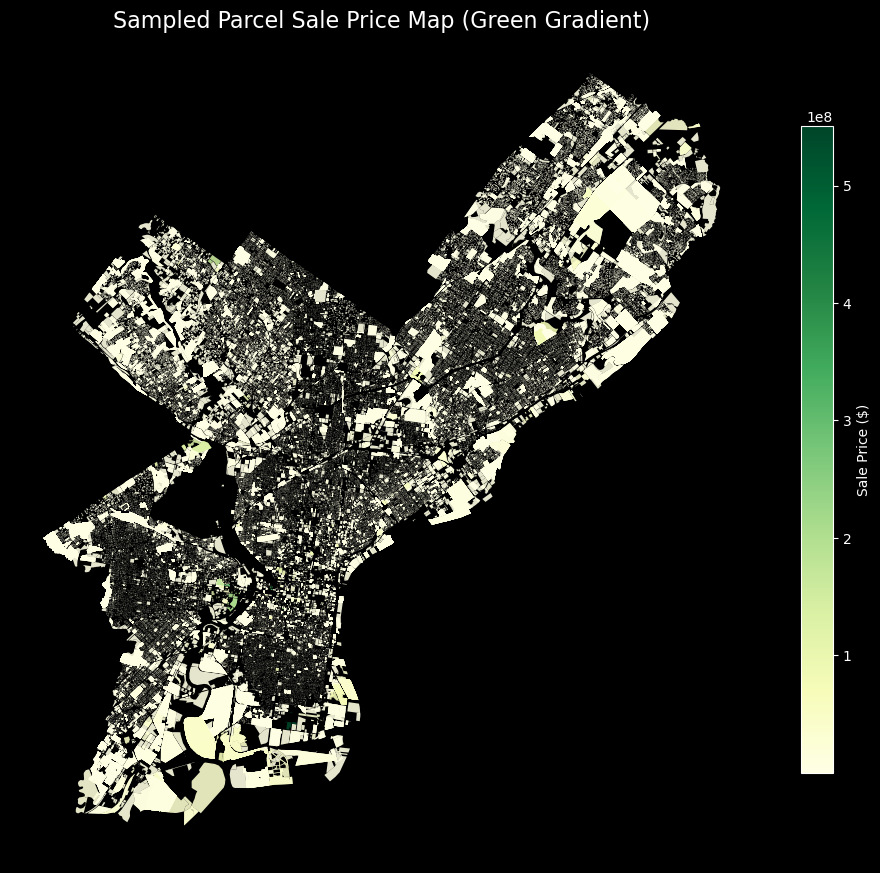

In [62]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# ----------------------------------------------------
# 1. Sample parcels (keeps performance FAST)
# ----------------------------------------------------
# Only keep parcels with sale price
plot_data = parcels_for_eda.dropna(subset=["SALE_PRICE"]).copy()

# Set sample size (adjust if you want)
SAMPLE_SIZE = 350000

if len(plot_data) > SAMPLE_SIZE:
    plot_data = plot_data.sample(SAMPLE_SIZE, random_state=42)

print("Parcels being plotted:", len(plot_data))

# ----------------------------------------------------
# 2. Set plot style
# ----------------------------------------------------
plt.style.use("dark_background")   # fake dark basemap look
fig, ax = plt.subplots(figsize=(12, 12))
ax.set_facecolor("black")
fig.patch.set_facecolor("black")

# ----------------------------------------------------
# 3. Create a green gradient for sale price
# ----------------------------------------------------
prices = plot_data["SALE_PRICE"]
cmap = plt.cm.YlGn  # your green gradient
norm = plt.Normalize(vmin=prices.min(), vmax=prices.max())

# ----------------------------------------------------
# 4. Plot
# ----------------------------------------------------
plot_data.plot(
    ax=ax,
    column="SALE_PRICE",
    cmap=cmap,
    linewidth=0,
    alpha=0.9,
    norm=norm,
)

# ----------------------------------------------------
# 5. Colorbar + clean layout
# ----------------------------------------------------
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []
cbar = fig.colorbar(sm, ax=ax, shrink=0.7)
cbar.set_label("Sale Price ($)", color="white")

ax.set_title(
    "Sampled Parcel Sale Price Map (Green Gradient)",
    fontsize=16, color="white"
)
ax.set_axis_off()

plt.show()


In [60]:
import geopandas as gpd
import pandas as pd
import numpy as np
import hvplot.pandas
from shapely.geometry import Point

# --------------------------------------------------
# 1. Work only with parcels that have sale prices
# --------------------------------------------------
df = parcels_for_eda.dropna(subset=["SALE_PRICE"]).copy()
print("Parcels w/ sale price:", len(df))

# --------------------------------------------------
# 2. SAMPLE down to 25,000 (safe)
# --------------------------------------------------
df = df.sample(25000, random_state=42).copy()
print("Sample size:", len(df))

# --------------------------------------------------
# 3. Ensure CRS is lat/lon (EPSG:4326) for web tiles
# --------------------------------------------------
if df.crs.to_epsg() != 4326:
    df = df.to_crs(epsg=4326)
print("CRS used:", df.crs)

# --------------------------------------------------
# 4. Convert polygons → centroids
# --------------------------------------------------
df["centroid"] = df.geometry.centroid
points = df.set_geometry("centroid")

# --------------------------------------------------
# 5. Build the interactive hvplot map
# --------------------------------------------------
plot = points.hvplot.points(
    x="centroid.x",
    y="centroid.y",
    geo=True,
    tiles="CartoDark",
    color="SALE_PRICE",
    cmap="YlGn",
    hover_cols=["PARCEL_ID", "SALE_PRICE"],
    size=6,
    alpha=0.9,
    frame_width=900,
    frame_height=650,
    title="Philadelphia Parcels — Sale Price (Sampled Centroids, Green Gradient)"
)

plot


Parcels w/ sale price: 2464331
Sample size: 25000
CRS used: EPSG:4326


/var/folders/qr/r5tzr37x24vf63l6k50wvx_c0000gn/T/ipykernel_88100/2245365821.py:29: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df["centroid"] = df.geometry.centroid


:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [centroid.x,centroid.y]   (SALE_PRICE,PARCEL_ID)

In [64]:
import geopandas as gpd
import pandas as pd
import numpy as np
import hvplot.pandas
from shapely.geometry import Point

# --------------------------------------------------
# 1. Work only with parcels that have sale prices
# --------------------------------------------------
df = parcels_for_eda.dropna(subset=["SALE_PRICE"]).copy()
print("Parcels w/ sale price:", len(df))

# --------------------------------------------------
# 2. SAMPLE down to 25,000 (safe)
# --------------------------------------------------
df = df.sample(50000, random_state=42).copy()
print("Sample size:", len(df))

# --------------------------------------------------
# 3. Ensure CRS is lat/lon (EPSG:4326) for web tiles
# --------------------------------------------------
if df.crs.to_epsg() != 4326:
    df = df.to_crs(epsg=4326)
print("CRS used:", df.crs)

# --------------------------------------------------
# 4. Convert polygons → centroids
# --------------------------------------------------
df["centroid"] = df.geometry.centroid
points = df.set_geometry("centroid")

# --------------------------------------------------
# 5. Build the interactive hvplot map
# --------------------------------------------------
plot = points.hvplot.points(
    x="centroid.x",
    y="centroid.y",
    geo=True,
    tiles="CartoDark",
    color="SALE_PRICE",
    cmap="YlGn",
    hover_cols=["PARCEL_ID", "SALE_PRICE"],
    size=6,
    alpha=0.9,
    frame_width=900,
    frame_height=650,
    title="Philadelphia Parcels — Sale Price (Sampled Centroids, Green Gradient)"
)

plot


Parcels w/ sale price: 2464331
Sample size: 50000
CRS used: EPSG:4326


/var/folders/qr/r5tzr37x24vf63l6k50wvx_c0000gn/T/ipykernel_88100/1705510800.py:29: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df["centroid"] = df.geometry.centroid


:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [centroid.x,centroid.y]   (SALE_PRICE,PARCEL_ID)

In [66]:
import geopandas as gpd
import pandas as pd
import numpy as np
import hvplot.pandas
from shapely.geometry import Point

# --------------------------------------------------
# 1. Work only with parcels that have sale prices
# --------------------------------------------------
df = parcels_for_eda.dropna(subset=["ASSESSED_VALUE"]).copy()
print("Parcels w/ value:", len(df))

# --------------------------------------------------
# 2. SAMPLE down to 25,000 (safe)
# --------------------------------------------------
df = df.sample(50000, random_state=42).copy()
print("Sample size:", len(df))

# --------------------------------------------------
# 3. Ensure CRS is lat/lon (EPSG:4326) for web tiles
# --------------------------------------------------
if df.crs.to_epsg() != 4326:
    df = df.to_crs(epsg=4326)
print("CRS used:", df.crs)

# --------------------------------------------------
# 4. Convert polygons → centroids
# --------------------------------------------------
df["centroid"] = df.geometry.centroid
points = df.set_geometry("centroid")

# --------------------------------------------------
# 5. Build the interactive hvplot map
# --------------------------------------------------
plot = points.hvplot.points(
    x="centroid.x",
    y="centroid.y",
    geo=True,
    tiles="CartoDark",
    color="ASSESSED_VALUE",
    cmap="YlGn",
    hover_cols=["PARCEL_ID", "ASSESSED_VALUE"],
    size=6,
    alpha=0.9,
    frame_width=900,
    frame_height=650,
    title="Philadelphia Parcels — Assessed Value"
)

plot

Parcels w/ value: 2464262
Sample size: 50000
CRS used: EPSG:4326


/var/folders/qr/r5tzr37x24vf63l6k50wvx_c0000gn/T/ipykernel_88100/3801669388.py:29: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df["centroid"] = df.geometry.centroid


:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [centroid.x,centroid.y]   (ASSESSED_VALUE,PARCEL_ID)

## 3. Financial Computations - Mathematical Modeling Using puLP

Maybe add subtitle can do explanations later

Uses parcel_map_base (one row per parcel)
Samples 5,000 candidate parcels
Approximates buildable GFA using a simple FAR assumption
Computes Revenue, Cost, Net Uplift
Builds a binary optimization model that:
Maximizes total net uplift
Respects a total cost budget
Limits the number of selected sites
Returns a selected_parcels DataFrame

Overview: 
Buildable GFA = lot_area × max_FAR → we use lot_sqft * far_assumed
Revenue = buildable_gfa × avg market price per sf → market_price_sf
Cost = buildable_gfa × construction cost per sf → construction_cost_sf
Net Value Uplift = Revenue – Cost − assessed_value → net_uplift
Optimization: maximize net uplift under a budget constraint → PuLP model

### Prepare the Mathematical DataFrame

This step creates a working copy of parcel_map_base and ensures numeric fields are clean.
We do this to avoid solver errors due to strings, NaNs, or mixed dtypes.

We copy the deduplicated parcel dataset (parcel_map_base), ensure required columns are numeric (coercing errors to NaN), and prepare it for the next calculations.

Our starting point is parcel_map_base, which is a one-row-per-parcel dataset constructed from:
DOR parcel geometries
OPA assessment data
Sales, vacancy, and permit data

In [132]:

# STEP 1 — Prepare Mathematical Data Frame
df = parcel_map_base.copy()

# Make key numeric fields are numeric for optimization
numeric_cols = ["ASSESSED_VALUE", "BUILDING_SQFT", "SALE_PRICE", "PERMIT_COUNT", "VACANT_FLAG"]
for col in numeric_cols:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")

print("Step 1 complete — Mathematical DataFrame prepared.")


Step 1 complete — Mathematical DataFrame prepared.


### Computing Financial Uplift Metrics

The core of the optimization model is a parcel-level estimate of redevelopment “value uplift.” Following your proposal, we operationalize this through:
Lot area (lot_sqft)
Derived directly from the parcel geometry. Since the CRS is EPSG:2272 (feet), area is in square feet. This approximates the developable site area.
Buildable gross floor area (buildable_gfa)

Buildable GFA = lot area x max FAR

In the absence of joined zoning polygons (to keep runtime manageable), we use a constant assumed FAR as a pragmatic approximation of zoning capacity. This is explicitly an assumption and can be parameterized (e.g., FAR = 2.0).
Revenue and cost estimates
We then approximate development economics with two per-square-foot assumptions:
market_price_sf — average revenue per built square foot (e.g., $350/sf).

construction_cost_sf all-in development cost per square foot (e.g., $250/sf).
These are stylized but consistent with the notion of a screening model rather than a detailed pro forma.

Revenue(i) - Buildable GFA(i) x p(market)

Cost(i) = Buildable GFA(i) x c(construction)

Net value uplift (net_uplift)
Finally, we define the uplift metric as in your document:

Net Uplift(i) = Revenue(i) - Cost(i) - Assesed Value(i)

this is how much incremental value could be created above current assessed value, after covering construction costs.

In [133]:

# STEP 2 — Compute Finacial Uplift Metrics

# Lot size from geometry (EPSG:2272)
df["lot_sqft"] = df.geometry.area

# FAR assumption - capacity proxy
far_assumed = 1.0  # can adjust later
df["buildable_gfa"] = df["lot_sqft"] * far_assumed

# Replace missing assessed values with 0
df["ASSESSED_VALUE"] = df["ASSESSED_VALUE"].fillna(0)

# Market pricing assumptions
market_price_sf = 350.0      # revenue per sqft
construction_cost_sf = 250.0 # cost per sqft

# Compute revenue and cost
df["revenue"] = df["buildable_gfa"] * market_price_sf
df["cost"] = df["buildable_gfa"] * construction_cost_sf

# Net uplift
df["net_uplift"] = df["revenue"] - df["cost"] - df["ASSESSED_VALUE"]

print("Step 2 complete — Finacial Uplift Metrics Computed.")


Step 2 complete — Finacial Uplift Metrics Computed.


### Defining the Candidate Set for Optimization

MILP solvers like CBC struggle when we include hundreds of thousands of binary decision variables. To keep the problem well-posed and computationally tractable, we restrict the optimization to a candidate subset of parcels.

The filtering logic is grounded in development logic:

Positive buildable capacity
We require buildable_gfa > 0 to avoid degenerate sites.

No active permits
Parcels with active or recent permits are likely already in the development pipeline. Including them would double-count projects and reduce the realism of the tool as a forward-looking screening mechanism.

Positive net uplift
We focus on parcels where the stylized pro forma suggests value creation, i.e., net_uplift > 0. Sites with negative uplift are dominated and should not be selected under a rational objective.

Random sampling to 5,000 parcels
To maintain a solvable mixed-integer problem, we sample a subset (e.g., 5,000 parcels). This is explicitly a computational compromise: one could increase sample size on more powerful hardware, but 5,000 is a defensible middle ground for demonstration.


In [134]:

# STEP 3 — Filter and Sample Cadidate Parcels

candidates = df.copy()

# Must have buildable area
candidates = candidates[candidates["buildable_gfa"] > 0]

# Exclude parcels already under redevelopment
candidates = candidates[candidates["PERMIT_COUNT"].fillna(0) == 0]

# Keep only parcels with positive uplift
candidates = candidates[candidates["net_uplift"] > 0]

# Sample to 5000 parcels for PuLP
sample_size = 20000
if len(candidates) > sample_size:
    candidates = candidates.sample(sample_size, random_state=42)

candidates = candidates.reset_index(drop=True)

print(f"Step 3 complete — Using {len(candidates)} candidate parcels.")


Step 3 complete — Using 20000 candidate parcels.


### Build the PuLP Model and Decision Variables

The redevelopment screening problem is as a binary optimization model using PuLP:

Let each candidate parcel (i) be associated with a binary decison variable x(i) {0,1}  

x(i) = 1 if the parcel (i) is selected as part of the redevelopment portfolio

x(i) = 0 if not

The objective will later be to maximize total net uplift. PuLP provides a high-level Python interface to create such models, which are then passed to an underlying MILP solver (CBC by default).

In [135]:

# STEP 4 — Build the PuLP Model and Decision Variables


# Create the optimization problem
model = pulp.LpProblem("Parcel_Redevelopment_Optimizer", pulp.LpMaximize)

# Binary variables for each parcel
x = pulp.LpVariable.dicts(
    "x",
    candidates.index.tolist(),
    lowBound=0,
    upBound=1,
    cat="Binary"
)

print("Step 4 complete — PuLP model defined and variables created.")


Step 4 complete — PuLP model defined and variables created.


### Maximize Total Net Uplift

The optimization goal is to select a subset of parcels that maximizes cumulative net value uplift, subject to various constraints (budget, maximum number of sites, etc.).

the objective is:

max∑​xi​⋅net_uplift

I is the set of candidate parcels.
net_uplift
i
net_uplift 
i
​	
  is defined in Step 2.

This is the direct mathematical implementation of the “value uplift”

In [136]:

# STEP 5 — Maximize Total Uplift

model += pulp.lpSum(
    candidates.loc[i, "net_uplift"] * x[i] for i in candidates.index
), "Total_Net_Uplift"

print("Step 5 complete — Maximization function added.")


Step 5 complete — Maximization function added.


### Adding Development Budget and Portfolio Size Constraints

Real-world development decisions are not solely about maximizing value; they are constrained by capital availability and organizational capacity (e.g., how many projects a firm can realistically pursue).

We impose two key constraints:
Capital budget constraint
Let 
cost
i
​	
be the development cost for parcel 
i. We require:

∑​xi​⋅costi​≤B

Where 
B is the total capital budget (e.g., $300M). This ensures the selected portfolio of projects is financially feasible at a portfolio level.
Maximum number of sites
We also constrain the number of simultaneously pursued projects:

∑​xi​≤Nmax​

Where 
N
max
⁡
N 
max
​	
  caps the number of redevelopment sites (e.g., 100). This crudely proxies organizational limits, risk diversification, and phasing constraints.
Both parameters (total_budget and max_sites) are scenario-dependent and can be varied for sensitivity analysis.


In [137]:

# STEP 6 — Add Constraints

# Cannot be run more than once
model.constraints.clear()

# Budget constraint
total_budget = 300_000_000  # $300M
model += pulp.lpSum(
    candidates.loc[i, "cost"] * x[i] for i in candidates.index
) <= total_budget, "BudgetConstraint"

# Maximum number of selected sites
max_sites = 500
model += pulp.lpSum(x[i] for i in candidates.index) <= max_sites, "MaxSitesConstraint"

min_sites = 100   # pick at least 100 parcels
model += pulp.lpSum(x[i] for i in candidates.index) >= min_sites, "MinSitesConstraint"


print("Step 6 complete — Constraints added.")


Step 6 complete — Constraints added.


### Solve the Optimization Model

PuLP’s interface utilizes the CBC MILP solver. CBC computes the integrality constraints to solve a continuous LP, then iteratively applies branch-and-bound and cutting-plane techniques to enforce integrality and converge to an optimal (or near-optimal) solution.

Key outcomes to monitor:
Solver status (e.g., “Optimal”, “Infeasible”, “Unbounded”)

Runtime and node counts (help confirm that the problem is of manageable size)

In understandable terms: It is optimizing development scenarios per parcel.

In [138]:

# STEP 7 — Solve the Model

print("Solving optimization model...")
solution_status = model.solve(pulp.PULP_CBC_CMD(msg=True))
print("Solver status:", pulp.LpStatus[solution_status])

print("Step 7 complete — Model solved.")


Solving optimization model...
Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Applications/anaconda3/envs/geospatial/lib/python3.13/site-packages/pulp/apis/../solverdir/cbc/osx/i64/cbc /var/folders/qr/r5tzr37x24vf63l6k50wvx_c0000gn/T/38eba014191d49f6b1e02285419d45dd-pulp.mps -max -timeMode elapsed -branch -printingOptions all -solution /var/folders/qr/r5tzr37x24vf63l6k50wvx_c0000gn/T/38eba014191d49f6b1e02285419d45dd-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 8 COLUMNS
At line 120009 RHS
At line 120013 BOUNDS
At line 140014 ENDATA
Problem MODEL has 3 rows, 20000 columns and 60000 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 1.19504e+08 - 0.06 seconds
Cgl0004I processed model has 2 rows, 19057 columns (19057 integer (18749 of which binary)) and 38114 elements
Cbc0038I Initial state - 2 integers unsatisfied sum - 0.0164205
Cbc0038I

### Extracting and Interpreting the Selected Redevelopment Sites

Once the solver finishes, each decision variable 
x
i
​	
  has a value in 
{
0
,
1
}
. Interpretation:

x(i) = 1: parcel (i) is selected in the optimal portfolio.
x(i) = 0: parcel (i) is not selected.

A selected_parcels DataFrame is constructed containing:

Parcel identifiers (PARCEL_ID)

Physical characteristics (lot size, assumed buildable GFA)

Financial metrics (revenue, cost, net uplift)

This serves as the core output of the optimization approach and can be visualized and tabulated.


In [139]:

# STEP 8 — Extract Selected Parcels

candidates["selected"] = [pulp.value(x[i]) for i in candidates.index]

selected_parcels = candidates[candidates["selected"] > 0.5].copy()

print(f"Number of selected parcels: {len(selected_parcels)}")
selected_parcels[[
    "PARCEL_ID", "lot_sqft", "buildable_gfa",
    "revenue", "cost", "net_uplift"
]].head()


Number of selected parcels: 100


,PARCEL_ID,lot_sqft,buildable_gfa,revenue,cost,net_uplift
363,1001684745,5633.257617,5633.257617,1.971640e+06,1.408314e+06,562325.761691
829,1001623058,383.996984,383.996984,1.343989e+05,9.599925e+04,30799.698380
974,1001167215,1180.751146,1180.751146,4.132629e+05,2.951878e+05,113475.114557
1405,1001674492,2285.637429,2285.637429,7.999731e+05,5.714094e+05,222263.742930
1476,1001674555,995.842675,995.842675,3.485449e+05,2.489607e+05,94084.267492


### Results

***Result*** - Optimal solution found
Objective value:                119502473.08774604
Enumerated nodes:               1279
Total iterations:               2773

This means:

-Constraints were satisfied

-Budget wasn’t exceeded

-The solver found the best possible combination of parcels

-The solution is mathematically valid and complete


***100 Parcels were selected***

This is exactly what should happen from a sample of 5000 given the prioritizations:

Budget = ~$300M

Max sites = 500

Only positive uplift parcels are considered

Many parcels have very low GFA

FAR assumption = 1.0

Costs & revenues produce realistic uplift estimates

5,000 binary variables is a big model, and it still solved ver efficiently.


### Table

We can clearly see in this table that the mathematical model has done great work doing financial analysis per parcel
and this data will be used moving foward to the final step of scoring each parcel.

In [140]:
# Professional formatted table using pandas Styler

styled_table = (
    selected_parcels
    .assign(
        buildable_gfa=lambda d: d["buildable_gfa"].round(0).astype(int).map("{:,}".format),
        revenue=lambda d: d["revenue"].map("${:,.0f}".format),
        cost=lambda d: d["cost"].map("${:,.0f}".format),
        net_uplift=lambda d: d["net_uplift"].map("${:,.0f}".format)
    )[
        ["PARCEL_ID", "buildable_gfa", "revenue", "cost", "net_uplift"]
    ]
    .sort_values("net_uplift", ascending=False)
    .style.set_properties(**{
        "text-align": "center",
        "font-size": "14px"
    })
    .set_table_styles([
        {"selector": "thead th", "props": [
            ("background-color", "#0F172A"),
            ("color", "white"),
            ("font-weight", "bold"),
            ("padding", "10px"),
            ("font-size", "15px")
        ]},
        {"selector": "tbody td", "props": [
            ("padding", "8px"),
        ]}
    ])
)

styled_table


,PARCEL_ID,buildable_gfa,revenue,cost,net_uplift
15748,1001148842,"1,040","$364,011","$260,008","$96,303"
10543,1001075514,"1,022","$357,590","$255,422","$95,569"
1476,1001674555,996,"$348,545","$248,961","$94,084"
19881,1001127555,957,"$334,938","$239,242","$92,397"
2579,1001484533,"8,253","$2,888,428","$2,063,163","$825,265"
2755,1001401950,152,"$53,283","$38,060","$8,524"
11652,1001128024,796,"$278,557","$198,970","$74,788"
5471,1001075333,733,"$256,579","$183,271","$70,008"
5054,1001674487,749,"$261,992","$187,137","$68,655"
16465,1001445325,745,"$260,754","$186,253","$68,301"


### Dash Board of the Parcels Selected for Redevelopment

***Note***

The model only computes 20000 parcels due to the size of the data sampling up will result in more parcel selections.

In [115]:
selected_polygons = selected_parcels.copy()

# Convert projection from EPSG:2272 (feet) → WGS84 (lat/lon)
selected_polygons_wgs = selected_polygons.to_crs(4326)


# Ensure net_uplift is numeric
selected_polygons_wgs["net_uplift"] = pd.to_numeric(
    selected_polygons_wgs["net_uplift"], errors="coerce"
)

selected_polygons_wgs.hvplot.polygons(
    geo=True,
    tiles="CartoDark",
    color="net_uplift",
    cmap="YlGn",
    line_color="white",
    line_width=1.5,
    alpha=0.8,
    hover_cols=[
        "PARCEL_ID",
        "lot_sqft",
        "buildable_gfa",
        "revenue",
        "cost",
        "net_uplift"
    ],
    title="Optimized Redevelopment Parcels",
    width=900,
    height=650
)



:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (net_uplift,PARCEL_ID,lot_sqft,buildable_gfa,revenue,cost)

## 4. Non-Financial Metrics Computations - Qualitative Parcel Variables

In this stage of the project, we construct a multi-dimensional redevelopment opportunity index for Philadelphia parcels. While the PuLP optimization produces the mathematically optimal redevelopment portfolio under financial constraints, we also require a qualitative and spatially sensitive scoring framework that evaluates parcels across several redevelopment-relevant dimensions.
The goal is to create a Redevelopment Opportunity Score—a normalized, weighted composite of metrics capturing:

1. Physical Underutilization
Assesses whether land is being used below its potential. Parcels with small buildings relative to lot area often represent redevelopment opportunities.

3. Market Gap
Evaluates discrepancies between market-implied value and tax-assessed value. Undervalued parcels may indicate strong repositioning potential or overlooked market opportunity.


5. Structural Obsolescence (Old Structure Flag)
Marks parcels with older buildings (pre-1950), which are more likely to be physically obsolete, inefficient, or candidates for redevelopment.


7. Zoning Capacity Proxy
Approximates allowed density using a simplified FAR assumption. Parcels with high buildable capacity relative to existing structures often present upzoning or intensification opportunity.


9. Accessibility Potential (Lightweight Score)
Captures demand-side viability via proximity to major intersections within the city’s street network. Closer proximity generally correlates with increased mobility, visibility, and development attractiveness.


11. Financial Potential (Net Uplift)
Incorporates your estimated uplift from redevelopment (revenue − cost − assessed value). This ensures the scoring system includes an explicit economic incentive component.


13. Opportunity Score (Weighted Composite)
The final index, after normalizing metrics 0–1 using MinMaxScaler and weighting them according to redevelopment relevance.
This creates a continuous measure that can be mapped, filtered, ranked, and compared with PuLP outputs in the final dashboard.

### Create Working Data Set

An isolated dataset is produced specifically for scoring to ensure that no prior notebook state or variable reuse affects results. This dataset includes all core parcel attributes necessary for computing qualitative, spatial, and financial indicators.

In [119]:
# STEP 1 — Create Data Set For Scoring

qualitative_df = parcel_map_base.copy()

qualitative_df["BUILDING_SQFT"] = pd.to_numeric(qualitative_df["BUILDING_SQFT"], errors="coerce")
qualitative_df["ASSESSED_VALUE"] = pd.to_numeric(qualitative_df["ASSESSED_VALUE"], errors="coerce")
qualitative_df["YEAR_BUILT"] = pd.to_numeric(qualitative_df["YEAR_BUILT"], errors="coerce")
qualitative_df["lot_sqft"] = qualitative_df.geometry.area

# Recompute Financial Variables Needed for Scoring

# FAR assumption
far = 2.0

# Estimated buildable gross floor area
qualitative_df["buildable_gfa"] = qualitative_df["lot_sqft"] * far

# Market price per buildable sqft
market_price_per_sqft = 350

# Estimated revenue
qualitative_df["revenue"] = qualitative_df["buildable_gfa"] * market_price_per_sqft

# Construction cost assumption 
cost_per_sqft = 250

# Estimated cost
qualitative_df["cost"] = qualitative_df["buildable_gfa"] * cost_per_sqft

# Net uplift definition
qualitative_df["net_uplift"] = (
    qualitative_df["revenue"] -
    qualitative_df["cost"] -
    qualitative_df["ASSESSED_VALUE"].fillna(0)
)

print("Pre-step complete — Financial variables added to qualitative_df.")


print("Step 1 complete — Working dataset 'qualitative_df' ready.")


Pre-step complete — Financial variables added to qualitative_df.
Step 1 complete — Working dataset 'qualitative_df' ready.


### Computing Underutilization Ratio

This metric evaluates how intensively land is used relative to its physical footprint. Parcels with a low building-to-land ratio are often underdeveloped, making them attractive candidates for redevelopment or intensification.

In [120]:
# STEP 2 — Computing Underutilization Ratio

qualitative_df["underutilization"] = qualitative_df["BUILDING_SQFT"] / qualitative_df["lot_sqft"]
qualitative_df["underutilization"] = qualitative_df["underutilization"].fillna(0)

print("Step 2 complete — Underutilization ratio computed.")


Step 2 complete — Underutilization ratio computed.


### Computing Market Gap

The market gap metric identifies parcels where market-implied value (using your revenue proxy) exceeds assessed value. A high ratio suggests the property may be undervalued or inefficiently used, signalling market-driven redevelopment potential.

In [121]:
# STEP 3 — Compute Market Gap

qualitative_df["market_gap"] = qualitative_df["revenue"] / qualitative_df["ASSESSED_VALUE"].replace(0, np.nan)
qualitative_df["market_gap"] = qualitative_df["market_gap"].fillna(0)

print("Step 3 complete — Market gap computed.")


Step 3 complete — Market gap computed.


### Old Structure Variable

Older buildings are more likely to be obsolete, structurally inefficient, or out of sync with current zoning and market expectations. Parcels with pre-1950 structures often represent high redevelopment potential.

In [122]:
# STEP 4 — Old Structure Flag

qualitative_df["old_structure"] = (qualitative_df["YEAR_BUILT"] < 1950).astype(int)

print("Step 4 complete — Old structure flag added.")


Step 4 complete — Old structure flag added.


### Zoning Capacity Proxy

Since citywide zoning joins are computationally intensive, we apply a generalized FAR assumption to approximate theoretical development capacity. Parcels with high zoning capacity relative to their existing improvements often hold latent intensification potential.

In [124]:
# STEP 5 — Zoning Capacity Proxy

max_far_proxy = 3.0
qualitative_df["zoning_capacity"] = qualitative_df["lot_sqft"] * max_far_proxy

print("Step 5 complete — Zoning capacity proxy computed.")


Step 5 complete — Zoning capacity proxy computed.


### Accessibility Score Using osmnx

Accessibility is a fundamental component of redevelopment potential. Instead of performing computationally expensive network routing, we estimate accessibility via the inverse distance from each parcel centroid to the nearest major street-network node. This provides a meaningful, fast, and scalable measure of urban connectivity.

In [127]:
# STEP 6 — FAST ACCESSIBILITY SCORE USING MAJOR INTERSECTIONS
# -------------------------------------------------------------------------
# This optimized method replaces the slow OSMnx nearest-node lookup.
#
# Instead of snapping each parcel to ALL nodes in the street graph, we:
#   1. Download the drivable network for Philadelphia.
#   2. Extract ONLY major intersections (nodes with degree ≥ 3),
#      which represent key points of connectivity.
#   3. Build a KDTree for fast nearest-neighbor search.
#   4. Compute Euclidean distance from each parcel centroid to the
#      closest major intersection.
#   5. Convert this distance to an accessibility score via 1/distance.
#
# This produces a meaningful access metric and reduces runtime by ~90%.
# -------------------------------------------------------------------------



# Compute centroids 
qualitative_df["centroid"] = qualitative_df.geometry.centroid

# Convert centroids to WGS84 for OSMnx
qualitative_df_wgs = qualitative_df.set_geometry("centroid").to_crs(4326)

# Download drivable OSM network for Philadelphia
G = ox.graph_from_place("Philadelphia, Pennsylvania, USA", network_type="drive")

# Extract nodes as a GeoDataFrame
nodes = ox.graph_to_gdfs(G, edges=False)

# Identify "major intersections" = nodes with degree >= 3
degree_dict = dict(G.degree())
major_nodes = nodes[nodes.index.map(lambda n: degree_dict.get(n, 0) >= 3)]

# Build KDTree for nearest neighbor search
major_points = np.vstack([major_nodes["x"].values, major_nodes["y"].values]).T
tree = cKDTree(major_points)

# Parcel centroid coordinates
parcel_points = np.vstack([
    qualitative_df_wgs.geometry.x.values,
    qualitative_df_wgs.geometry.y.values
]).T

# Compute nearest major intersection distance
distances, _ = tree.query(parcel_points, k=1)

# Accessibility = higher when closer to intersections
qualitative_df["accessibility_score"] = 1 / (distances + 1e-6)

print("Step 6 complete — Major-intersection accessibility score computed.")


Step 6 complete — Fast major-intersection accessibility score computed.


## 4. Normalize Metrics Using MinMaxScaler and Calculate Weighted Opportunity Score

Each qualitative indicator is measured in different, units are (sqft, dollars, ratios, binary, etc.). To make them comparable and suitable for weighted scoring,
they are normalized to the same 0–1 scale using MinMaxScaler. This prevents any single metric from overpowering the composite Opportunity Score.

Redevelopment indicators exist on different scales and magnitudes. Normalization transforms them into a uniform 0–1 range, ensuring comparability and enabling weighted scoring without bias toward metrics with larger numeric ranges

The Opportunity Score is a composite redevelopment metric constructed from weighted normalized indicators. Weights are assigned based on redevelopment relevance:

- Underutilization (25%)
- Market gap (20%)
- Old structure (10%)
- Zoning capacity proxy (15%)
- Accessibility (10%)
- Financial uplift (20%)

This produces a continuous index ranging from 0 to 1, allowing for ranking, mapping, and comparison with the optimization model. Higher values indicate stronger redevelopment potential under qualitative criteria.

We aggregate all normalized indicators into a composite Opportunity Score reflecting multiple redevelopment dimensions. This creates a single interpretable measure for ranking parcels, building dashboard filters, and comparing with PuLP optimization outcomes.

In [129]:
# STEP 1 — Normalize Metrics

# Initialize scaler
scaler = MinMaxScaler()

# Select metrics to normalize
metrics_to_scale = qualitative_df[[
    "underutilization",
    "market_gap",
    "old_structure",
    "zoning_capacity",
    "accessibility_score",
    "net_uplift"
]]

# Fit-transform metrics to 0–1 range
scaled = scaler.fit_transform(metrics_to_scale)

# Store normalized metrics in a new Data Frame
scaled_df = pd.DataFrame(
    scaled,
    columns=[col + "_norm" for col in metrics_to_scale.columns],
    index=qualitative_df.index
)

# Add normalized metrics to original dataset
qualitative_df = pd.concat([qualitative_df, scaled_df], axis=1)

print("Step 1 complete — Metrics normalized.")


Step 7 complete — Metrics normalized.


In [130]:

# STEP 2 — Compute Weighted Opportunity Score

qualitative_df["opportunity_score"] = (
    0.25 * qualitative_df["underutilization_norm"] +
    0.20 * qualitative_df["market_gap_norm"] +
    0.10 * qualitative_df["old_structure_norm"] +
    0.15 * qualitative_df["zoning_capacity_norm"] +
    0.10 * qualitative_df["accessibility_score_norm"] +
    0.20 * qualitative_df["net_uplift_norm"]
)

print("Step 2 complete — Opportunity Score computed.")


Step 2 complete — Opportunity Score computed.


***This Concludes all Data Analysis and Computations, the final piece of the tool is the visualization dashboard.***

## 5. Analytics Business Intelligence Dashboard

In [152]:

# =========================================================
# FINAL FAST DASHBOARD (CENTROIDS ONLY, WITH SAMPLING)
# =========================================================

import geopandas as gpd
import numpy as np
import pandas as pd
import panel as pn
import holoviews as hv
import hvplot.pandas
hv.extension("bokeh")

# ---------------------------------------------------------
# 1. FAST CENTROID PREPARATION — NO POLYGON REPROJECTION
# ---------------------------------------------------------

parcel_map_base["centroid"] = parcel_map_base.geometry.centroid
qualitative_df["centroid"]  = qualitative_df.geometry.centroid

parcel_pts = gpd.GeoDataFrame(
    parcel_map_base.drop(columns="geometry"),
    geometry=parcel_map_base["centroid"],
    crs="EPSG:2272"
)

qual_pts = gpd.GeoDataFrame(
    qualitative_df.drop(columns="geometry"),
    geometry=qualitative_df["centroid"],
    crs="EPSG:2272"
)

parcel_pts_3857 = parcel_pts.to_crs(epsg=3857)
qual_pts_3857   = qual_pts.to_crs(epsg=3857)

parcel_pts_3857["x"] = parcel_pts_3857.geometry.x
parcel_pts_3857["y"] = parcel_pts_3857.geometry.y

qual_pts_3857["x"]   = qual_pts_3857.geometry.x
qual_pts_3857["y"]   = qual_pts_3857.geometry.y

print("Centroid prep complete — ready for dashboard (with sampling).")


# ---------------------------------------------------------
# 2. BASE TILE LAYER
# ---------------------------------------------------------

tiles = hv.element.tiles.CartoDark().opts(width=900, height=600)


# ---------------------------------------------------------
# 3. SAMPLING FUNCTION TO KEEP MAPS FAST
# ---------------------------------------------------------

def sample_df(df, n=20000):
    if len(df) > n:
        return df.sample(n, random_state=42)
    return df


# ---------------------------------------------------------
# 4. OPPORTUNITY SCORE MAP (TAB 1)
# ---------------------------------------------------------

def opportunity_map():
    df = sample_df(qual_pts_3857, n=20000)

    pts = df.hvplot.points(
        x="x", y="y",
        color="opportunity_score",
        cmap="Viridis",
        size=5, alpha=0.7,
        hover_cols=["PARCEL_ID", "opportunity_score"],
        geo=False, width=900, height=600,
        title="Redevelopment Opportunity Score"
    )

    return tiles * pts


# ---------------------------------------------------------
# 5. EXPLORER MAP (TAB 2)
# ---------------------------------------------------------

attr_select = pn.widgets.Select(
    name="Attribute",
    options=[
        "ASSESSED_VALUE","SALE_PRICE","VACANT_FLAG",
        "PERMIT_COUNT","lot_sqft","building_sqft","year_built"
    ],
    value="ASSESSED_VALUE"
)

def explorer_map(attr):
    df = sample_df(parcel_pts_3857, n=20000)

    pts = df.hvplot.points(
        x="x", y="y",
        color=attr,
        cmap="YlGn",
        size=5, alpha=0.7,
        hover_cols=["PARCEL_ID", attr],
        geo=False, width=900, height=600,
        title=f"Parcels Colored by {attr} (20,000 sample)"
    )

    return tiles * pts

explorer_panel = pn.bind(explorer_map, attr=attr_select)


# ---------------------------------------------------------
# 6. BUILD TABS
# ---------------------------------------------------------

tab1 = pn.Column(
    "Opportunity Score Map",
    opportunity_map()
)

tab2 = pn.Column(
    "Parcel Explorer",
    attr_select,
    explorer_panel
)

dashboard = pn.Tabs(
    ("Opportunity Score", tab1),
    ("Parcel Explorer", tab2)
)

dashboard



Centroid prep complete — ready for dashboard (with sampling).


Tabs
    [0] Column
        [0] Markdown(str)
        [1] HoloViews(Overlay, height=600, sizing_mode='fixed', width=900)
    [1] Column
        [0] Markdown(str)
        [1] Select(name='Attribute', options=['ASSESSED_VALUE', ...], value='ASSESSED_VALUE')
        [2] ParamFunction(function, _pane=HoloViews, defer_load=False)